In [31]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sn
import numpy as np

import xgboost as xgb

from scipy.fft import fft, fftfreq
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from sklearn.cluster import OPTICS
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, silhouette_score
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor


In [32]:
class CustomPlotter:

    @staticmethod
    def hist_and_boxplot(df: pd.DataFrame, col: str, ax=None, outlier_drop_pct=0):
        if ax is None:
            fig, (ax_hist, ax_boxplot) = plt.subplots(nrows=2, ncols=1, figsize=(10, 8), gridspec_kw={"height_ratios": (.85, .15), "hspace": 0.3})
        else:
            ax_hist, ax_boxplot = ax
        
        # Remove the top n% of data
        n_pct = int((outlier_drop_pct / 100) * len(df))
        
        df_ = df.sort_values(by=col).reset_index()
        df_ = df_.iloc[n_pct:]
        df_ = df_.iloc[:-n_pct]
        
        # Histogram with a vertical line at the mean value
        sn.histplot(data=df_, x=col, kde=False, ax=ax_hist)
        ax_hist.axvline(df_[col].mean(), color='r', linestyle='--', label=f'Mean: {df_[col].mean():.2f}')
        ax_hist.legend()
        ax_hist.set_title(f'Histogram and Boxplot for {col}')
        ax_hist.set_xlabel('')

        # Horizontal boxplot below the histogram
        sn.boxplot(data=df_, x=col, orient='h', ax=ax_boxplot)
        ax_boxplot.set_xlabel('')
        ax_boxplot.set_yticks([])

    @staticmethod
    def top_barplot_cat(df, col, ax=None, top_n_categories=10):
        if ax is None:
            ax = plt.gca()

        category_counts = df[col].value_counts(ascending=False).iloc[:top_n_categories]  # Select the N most frequent categories
        sn.barplot(x=list(category_counts.index), y=category_counts.values, palette='viridis', ax=ax)
        ax.set_title(f'Barplot for {col} (Top {top_n_categories} Ordered by Frequency)')
        ax.set_xlabel(col)
        ax.set_ylabel('Frequency')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)  # Rotate labels to prevent overlap

    @staticmethod
    def num_vs_target(df: pd.DataFrame, col: str, target: str, ax: plt.Axes = None):
        # Create the scatter plot and regression line in the provided Axes object
        if ax is None:
            ax = plt.gca()

        # Create scatter plot with regression line
        sn.scatterplot(data=df, x=col, y=target, alpha=0.7, ax=ax)
        ax.set_title(f"Scatter plot of {col} vs {target}")

        # Calculate and plot the linear regression line
        no_nan_data = df.dropna()
        X = no_nan_data[col].values.reshape(-1, 1)
        Y = no_nan_data[target].values.reshape(-1, 1)
        model = LinearRegression()
        model.fit(X, Y)
        y_pred = model.predict(X)

        y_min = df[target].min()
        y_max = df[target].max()
        y_range = y_max - y_min

        y_min -= y_range * .02
        y_max += y_range * .02

        ax.set_ylim((y_min, y_max))

        ax.plot(X, y_pred, color="red", linestyle="--", label="Linear regression")
        ax.legend()

    @staticmethod
    def cat_vs_target(df: pd.DataFrame, col: str, target: str, ax: plt.Axes = None, log_attrs=[]):
        # Sort categories by mean value
        category_order = df.groupby(col)[target].median().sort_values(ascending=False).index

        # Create boxplot for categorical columns in the provided Axes object
        if ax is None:
            ax = plt.gca()

        boxplot = sn.boxplot(data=df, x=col, y=target, order=category_order, ax=ax)
        ax.set_title(f"Boxplot of {target} by {col}")

        # Tilt category labels and adjust font size
        num_categories = len(category_order)
        
        if col in log_attrs: ax.set_yscale('log')

        fontsize = 8 if num_categories > 10 else 10
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=fontsize, ha="right")

    @staticmethod
    def combined_plots(df, columns, target, figsize=(14, 8), outlier_drop_pct=0, log_attrs=[]):
        sn.set_style('whitegrid')
        for col in columns:
            if col == target:
                continue
            fig = plt.figure(figsize=figsize)
            fig.suptitle(f'Analysis of {col}', fontsize=16)
            gs = fig.add_gridspec(6, 2)

            ax_target = fig.add_subplot(gs[:, 1])

            if pd.api.types.is_numeric_dtype(df[col]):
                ax_hist = fig.add_subplot(gs[:5, 0])
                ax_box = fig.add_subplot(gs[5, 0])
                CustomPlotter.hist_and_boxplot(df, col, ax=(ax_hist, ax_box), outlier_drop_pct=outlier_drop_pct)
                CustomPlotter.num_vs_target(df, col, target, ax=ax_target)
            else:
                ax_bp = fig.add_subplot(gs[:, 0])
                CustomPlotter.top_barplot_cat(df, col, ax=ax_bp, top_n_categories=10)
                CustomPlotter.cat_vs_target(df, col, target, ax=ax_target, log_attrs=log_attrs)
            
            plt.tight_layout()
            plt.show()
    
    @staticmethod
    def plot_histogram_boxplot(data, title, ax_hist, ax_box):
        sn.histplot(data=data, kde=True, ax=ax_hist)
        ax_hist.axvline(data.mean(), color='red', linestyle='--')
        ax_hist.set_title(title + ' Histogram')
        
        sn.boxplot(x=data, orient='h', ax=ax_box)
        ax_box.set_title(title + ' Boxplot')
        ax_box.set_yticks([])

    @staticmethod
    def find_optimal_period(data, min_period, max_period):
        best_period = None
        min_rss = np.inf

        for period in range(min_period, max_period + 1, 15):
            try:
                decomposition = STL(data, period=period).fit()
                residuals = decomposition.resid.dropna()
                rss = np.sum(residuals ** 2)

                if rss < min_rss:
                    min_rss = rss
                    best_period = period
            except ValueError:
                continue

        return best_period

    @staticmethod
    def plot_timeseries_decomposition(data, title, ax):
        min_period = 12
        max_period = 12 * 5 * 51
        optimal_period = CustomPlotter.find_optimal_period(data, min_period, max_period)

        decomposition = STL(data, period=optimal_period).fit()
        trend = decomposition.trend.dropna()
        seasonal = decomposition.seasonal.dropna()
        resid = decomposition.resid.dropna()

        ax[0].plot(data, label='Original')
        ax[0].set_title(title + ' Time Series [%d]' % optimal_period)
        
        ax[1].plot(trend, label='Trend')
        ax[1].set_title(title + ' Trend [%d]' % optimal_period)
        
        ax[2].plot(seasonal, label='Seasonality')
        ax[2].set_title(title + ' Seasonality [%d]' % optimal_period)
        
        ax[3].plot(resid, label='Residuals [%d]' % optimal_period)
        ax[3].set_title(title + ' Residuals')

    @staticmethod
    def plot_fft(data, title, ax):
        N = len(data)
        T = 10 * 60  # 10 minutes in seconds
        yf = fft(data.to_numpy())
        xf = fftfreq(N, T)[:N // 2]

        # Plot the FFT with logarithmic scale and real frequency (in Hz)
        ax.plot(xf, 20 * np.log10(2.0 / N * np.abs(yf[:N // 2])))
        ax.set_title(title + ' Frequency Domain')
        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Amplitude (dB)')
    
    @staticmethod
    def time_series_analysis(df, attribute):
        if attribute == 'Date Time':
            return

        data = df[attribute].dropna()

        sn.set(style='whitegrid')
        fig = plt.figure(figsize=(16, 12))
        fig.suptitle(f'Analysis of {attribute}', fontsize=16)
        
        # Create subplots with different heights
        gs = fig.add_gridspec(6, 2)
        ax_hist = fig.add_subplot(gs[:3, 0])
        ax_box = fig.add_subplot(gs[3, 0])
        ax_ts = [fig.add_subplot(gs[i, 1]) for i in range(4)]
        ax_fft = fig.add_subplot(gs[4:, :])

        # Call plotting functions
        CustomPlotter.plot_histogram_boxplot(data, attribute, ax_hist, ax_box)
        CustomPlotter.plot_timeseries_decomposition(data, attribute, ax_ts)
        CustomPlotter.plot_fft(data, attribute, ax_fft)
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    @staticmethod
    def plot_autocorrelation(df, attribute):
        data = df[attribute].dropna()
        
        fig, ax = plt.subplots(figsize=(8, 4))
        autocorrelation_plot(data, ax=ax)
        ax.set_title(f'Autocorrelation of {attribute}')
        plt.show()

    @staticmethod
    def plot_corrmatrix(df, figsize=(12, 10)):
        corr_matrix = df.corr()

        # Set up a Seaborn theme
        sn.set_theme(style="white")

        # Create a correlation matrix plot
        plt.figure(figsize=figsize)
        mask = np.triu(np.ones_like(corr_matrix, dtype=bool))  # Create a mask to display only the lower triangle
        cmap = sn.diverging_palette(230, 20, as_cmap=True)  # Generate a custom diverging colormap
        sn.heatmap(corr_matrix, mask=mask, cmap=cmap, center=0, annot=True, fmt=".2f",
                    square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot_kws={"fontsize": 10})
        plt.title("Correlation Matrix")
        plt.show()

    @staticmethod
    def autocorrelation_analysis(df):
        for attribute in df.columns:
            CustomPlotter.plot_autocorrelation(df, attribute)


In [52]:
df = pd.read_csv('../datasets/data_project_vgm_daily.csv').drop(columns=['level_0'])
df['t'] = pd.to_datetime(df['t'])
df = df.set_index(['t', 'symbol'])
df = df.sort_index()
df

o         h         l       c          v        n  \
t          symbol                                                           
2018-01-02 BABA    173.46  184.1000  172.4300  183.93   30309800   191226   
2018-01-03 BABA    183.95  185.7800  181.4000  183.85   20011104   136275   
2018-01-04 BABA    183.85  187.7472  183.8500  185.80   19451778   133778   
2018-01-05 BABA    185.80  190.7800  185.8000  190.70   18149493   122317   
2018-01-06 BABA    190.78  190.9000  190.7100  190.71       9943       87   
...                   ...       ...       ...     ...        ...      ...   
2023-03-31 MSFT    283.95  289.2700  283.0000  288.54   26112288   392735   
           NVDA    273.76  278.3431  271.0500  278.00   40344565   491902   
           PFE      40.40   40.8300   40.2800   40.79   23057408   103007   
           TSLA    195.35  208.0000  195.1500  207.65  166524307  1514566   
           XOM     109.40  110.1700  109.0499  109.60   14237593   108391   

                           vw      emaS      emaM      emaL  ...  EPS_Growth  \
t          symbol                                            ...               
2018-01-02 BABA    179.269037  1.012149  1.002620  1.000697  ...  352.666667   
2018-01-03 BABA    183.777505  1.016482  1.004765  1.001499  ...  352.666667   
2018-01-04 BABA    185.511399  1.014133  1.005210  1.001759  ...  352.666667   
2018-01-05 BABA    188.256131  1.014354  1.006123  1.002187  ...  352.666667   
2018-01-06 BABA    190.834919  1.014135  1.006844  1.002564  ...  352.666667   
...                       ...       ...       ...       ...  ...         ...   
2023-03-31 MSFT    285.714297  1.008123  1.005659  1.003333  ...   -0.012766   
           NVDA    275.237994  1.008898  1.008144  1.007205  ...    0.500000   
           PFE      40.531606  1.002394  1.000183  0.998595  ...   -0.359551   
           TSLA    202.163314  1.016296  1.006588  1.003783  ...    0.133333   
           XOM     109.580294  1.007286  1.002602  1.000323  ...   -0.235955   

                        ROE       ROA  Gross_Margin  Operating_Margin  \
t          symbol                                                       
2018-01-02 BABA    0.068788  0.033837      0.577516          0.313099   
2018-01-03 BABA    0.068788  0.033837      0.577516          0.313099   
2018-01-04 BABA    0.068788  0.033837      0.577516          0.313099   
2018-01-05 BABA    0.068788  0.033837      0.577516          0.313099   
2018-01-06 BABA    0.068788  0.033837      0.577516          0.313099   
...                     ...       ...           ...               ...   
2023-03-31 MSFT    0.089687  0.045055      0.677641          0.392047   
           NVDA    0.103538  0.060642      0.651978          0.376038   
           PFE     0.052205  0.025350      0.602800          0.216179   
           TSLA    0.082476  0.044779      0.237561          0.160416   
           XOM     0.065368  0.034547      0.961479          0.922560   

                   Net_Profit_Margin  Current_Ratio  Debt_to_Equity  \
t          symbol                                                     
2018-01-02 BABA             0.289938       1.966388        0.369558   
2018-01-03 BABA             0.289938       1.966388        0.369558   
2018-01-04 BABA             0.289938       1.966388        0.369558   
2018-01-05 BABA             0.289938       1.966388        0.369558   
2018-01-06 BABA             0.289938       1.966388        0.369558   
...                              ...            ...             ...   
2023-03-31 MSFT             0.315671       1.931313        0.262734   
           NVDA             0.346896       7.144518        0.459871   
           PFE              0.205599       1.216455        0.004025   
           TSLA             0.151616       1.531956        0.034874   
           XOM              0.133607       1.414020        0.074315   

                            FCF   spy_value  
t          symbol                            
2018-01-02 BABA

<AxesSubplot:xlabel='t,symbol'>

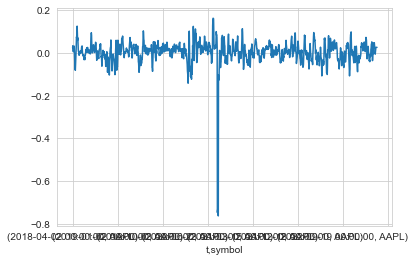

In [53]:
df.groupby('symbol').get_group('AAPL')['pc12'].plot()

In [54]:
def add_time_embedding(df, periods=[24, 24*7, 24*30, 24*365], names=['day', 'week', 'month', 'year'], columns_prefix="time_embed"):
    """
    Add time embeddings (sine and cosine) to a dataframe with time series data for multiple timescales.
    
    Parameters:
    - df: DataFrame with time series data
    - periods: List of periods for different timescales (e.g., [24, 24*7, 24*30] for hourly, weekly, and monthly)
    - columns_prefix: Prefix for the new columns with time embeddings
    """
    assert len(periods) == len(names)

    # Compute the elapsed time in hours
    elapsed_time = (df.index.get_level_values('t') - df.index.get_level_values('t').min()).total_seconds() / 3600

    for i, period in enumerate(periods):
        # Compute the time of the period as a fraction (0 to 1)
        time_of_period = elapsed_time / period

        # Compute the sine and cosine embeddings
        sine_embeddings = np.sin(2 * np.pi * time_of_period)
        cosine_embeddings = np.cos(2 * np.pi * time_of_period)

        # Add the embeddings to the dataframe
        df[f"{columns_prefix}_{names[i]}_sin"] = sine_embeddings
        df[f"{columns_prefix}_{names[i]}_cos"] = cosine_embeddings

In [55]:
add_time_embedding(df, periods=[24*7, 24*30, 24*365], names=['week', 'month', 'year'])

In [56]:
df.groupby(level='symbol').apply(lambda x: x['vw'].ewm(span=77).corr(x['spy_value']))

symbol  t           symbol
AAPL    2018-04-02  AAPL           NaN
        2018-04-03  AAPL     -1.000000
        2018-04-04  AAPL      0.535607
        2018-04-05  AAPL      0.980585
        2018-04-06  AAPL      0.980793
                                ...   
XOM     2023-03-27  XOM       0.491609
        2023-03-28  XOM       0.491663
        2023-03-29  XOM       0.490341
        2023-03-30  XOM       0.488620
        2023-03-31  XOM       0.485192
Length: 18124, dtype: float64

In [57]:
short_term = 11
long_term = 77

market_correlation_func = lambda x: pd.DataFrame(x['vw'].ewm(span=long_term).corr(x['spy_value']))
df['market_correlation'] = df.groupby(level='symbol').apply(market_correlation_func)

market_long_term_trend = lambda x: pd.DataFrame((x['spy_value'] / x['spy_value'].shift(1)).ewm(span=long_term).mean())
df['market_long_term_trend'] = df.groupby(level='symbol').apply(market_long_term_trend)

market_short_term_trend = lambda x: pd.DataFrame((x['spy_value'] / x['spy_value'].shift(1)).ewm(span=short_term).mean())
df['market_short_term_trend'] = df.groupby(level='symbol').apply(market_short_term_trend)

def market_change(x):
    diff = x['spy_value'] / x['spy_value'].shift(1)
    s = diff.ewm(span=77).std()
    m = diff.ewm(span=77).mean()
    return pd.DataFrame((diff - m) / s)
df['market_change'] = df.groupby(level='symbol').apply(market_change)

In [58]:
def compute_alpha_beta(group, window_size=77):
    stock_returns = group['vw'].pct_change(periods=12)
    SPY_returns = group['spy_value'].pct_change(periods=12)
    
    rolling_cov = stock_returns.ewm(span=window_size).cov(SPY_returns)
    rolling_var = SPY_returns.ewm(span=window_size).var()
    
    beta = rolling_cov / rolling_var
    alpha = stock_returns - beta * SPY_returns
    
    return pd.DataFrame({'alpha': alpha, 'beta': beta})

# Group the dataset by symbol and apply the function to each group
alpha_beta = df.groupby(level='symbol').apply(compute_alpha_beta)

df[['alpha', 'beta']] = alpha_beta
#alpha_beta.groupby('symbol').get_group('AAPL').sort_values(by='beta')['beta'][100:-100].hist(bins=50)

alpha_beta

alpha      beta
t          symbol                    
2018-01-02 BABA         NaN       NaN
2018-01-03 BABA         NaN       NaN
2018-01-04 BABA         NaN       NaN
2018-01-05 BABA         NaN       NaN
2018-01-06 BABA         NaN       NaN
...                     ...       ...
2023-03-31 MSFT    0.027599  1.227537
           NVDA    0.042518  2.199628
           PFE    -0.000587  0.283987
           TSLA   -0.059139  3.687416
           XOM     0.019938  0.914391

[18124 rows x 2 columns]

<AxesSubplot:>

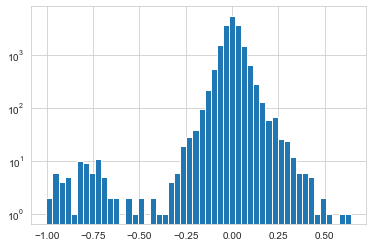

In [59]:
alpha_beta['alpha'].hist(bins=50, log=True)

In [60]:
df.dropna().head()

,,o,h,l,c,v,n,vw,emaS,emaM,emaL,...,time_embed_month_sin,time_embed_month_cos,time_embed_year_sin,time_embed_year_cos,market_correlation,market_long_term_trend,market_short_term_trend,market_change,alpha,beta
t,symbol,,,,,,,,,,,,,,,,,,,,,
2018-01-18,BABA,184.12,185.845,182.69,184.21,14222970,109914,184.125087,0.995751,1.000208,1.000841,...,-0.207912,-0.978148,0.271958,0.962309,0.187841,1.003130,1.002706,-0.006529,-0.256854,7.113374
2018-01-19,BABA,184.20,185.500,182.80,184.20,16554984,84794,184.195149,0.997294,1.000224,1.000825,...,-0.406737,-0.913545,0.288482,0.957485,0.073130,1.002978,1.002455,-0.643637,-0.113658,3.430033
2018-01-20,BABA,184.20,184.200,184.10,184.10,7346,34,184.123403,0.998066,1.000166,1.000786,...,-0.587785,-0.809017,0.304921,0.952378,-0.024337,1.002964,1.002517,-0.064896,-0.136262,3.900243
2018-01-22,BABA,184.20,185.290,181.68,184.70,15535713,97468,183.722858,0.997986,0.999943,1.000689,...,-0.866025,-0.500000,0.337523,0.941317,-0.115377,1.002919,1.002492,-0.228848,-0.166526,4.593763
2018-01-23,BABA,184.78,194.000,183.54,193.95,31893414,190621,188.706226,1.007699,1.002532,1.001555,...,-0.951057,-0.309017,0.353676,0.935368,-0.019163,1.003172,1.003180,1.320328,-0.162993,4.472152


In [61]:
df.reset_index().to_csv('final_dataset_daily.csv')

In [62]:
df.groupby('symbol')

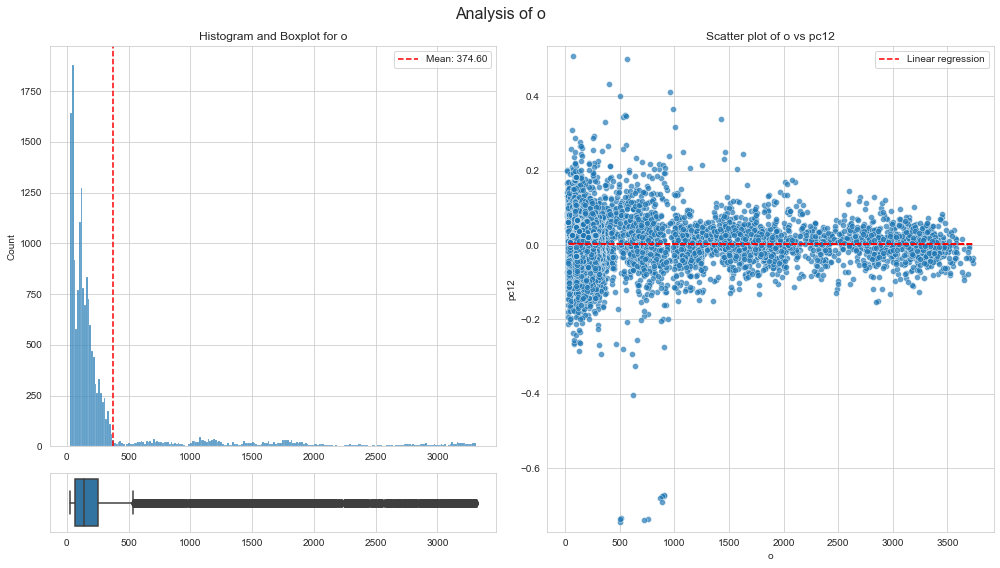

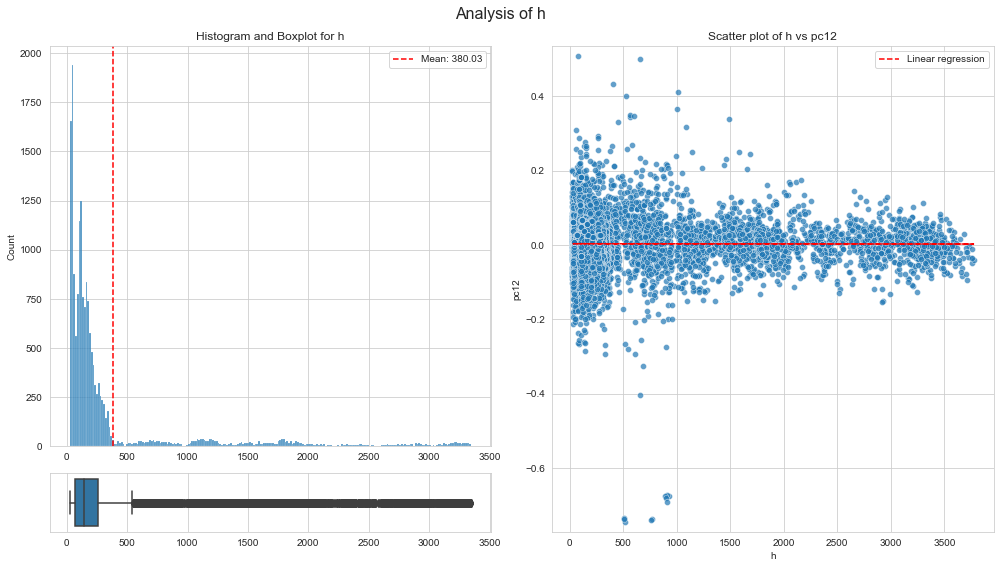

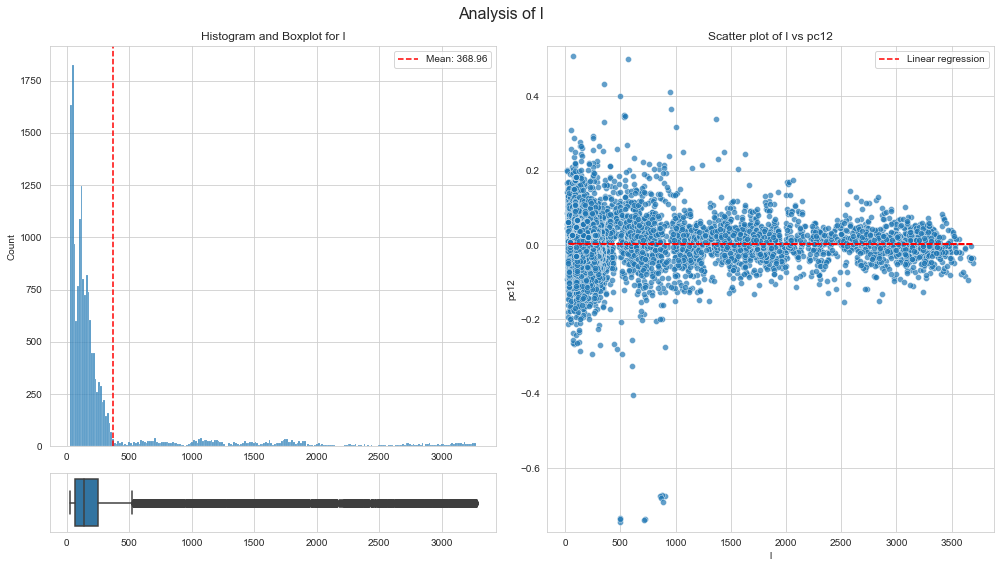

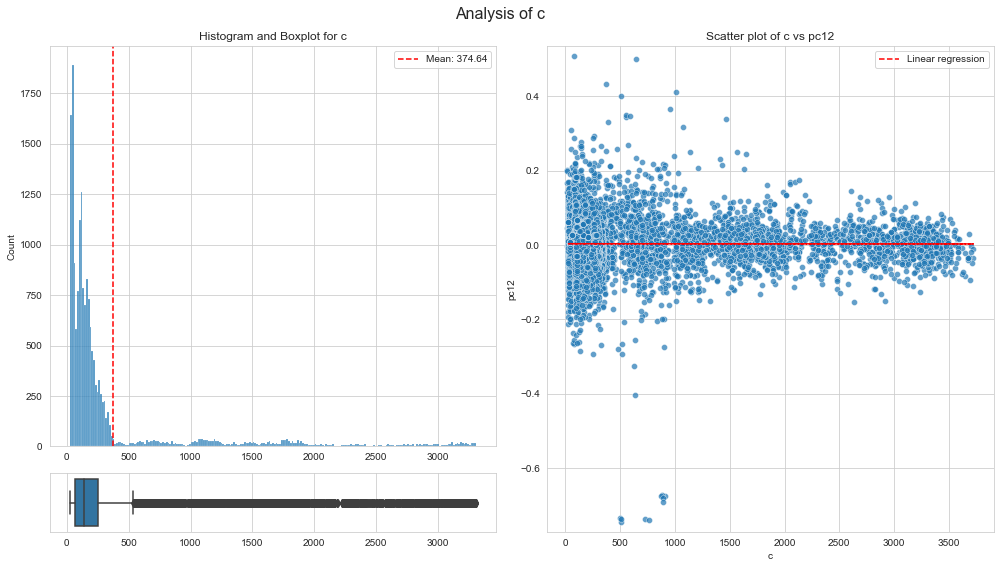

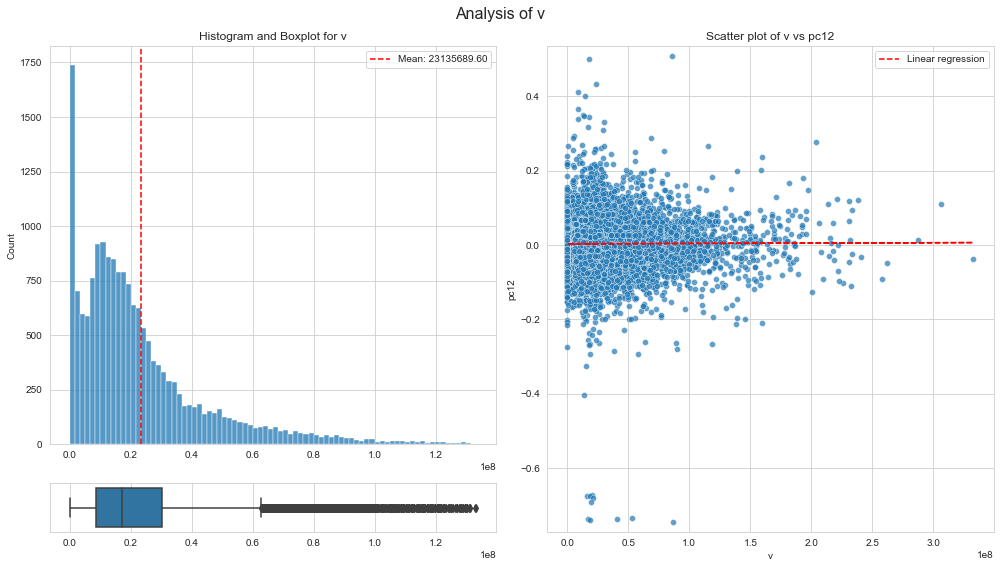

...

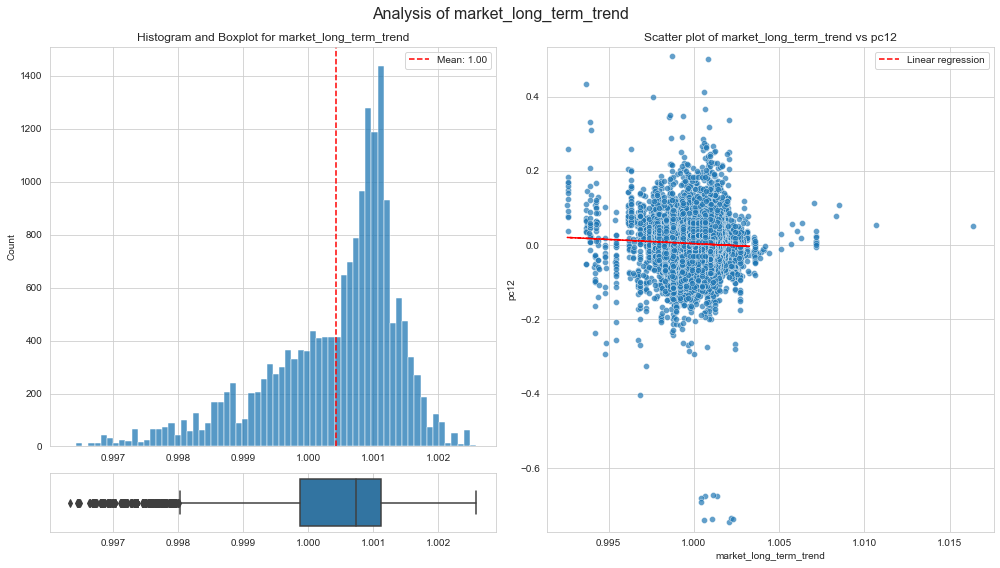

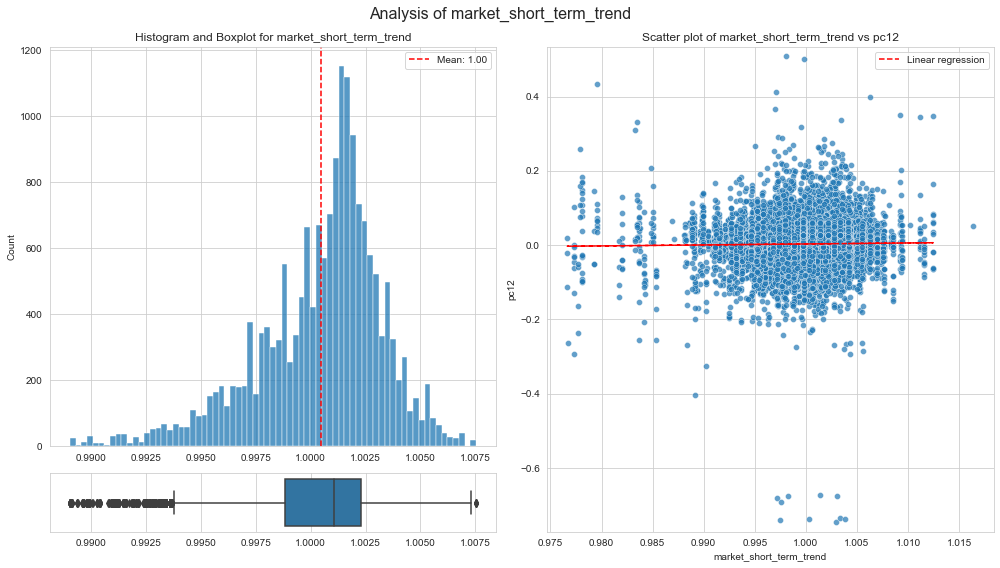

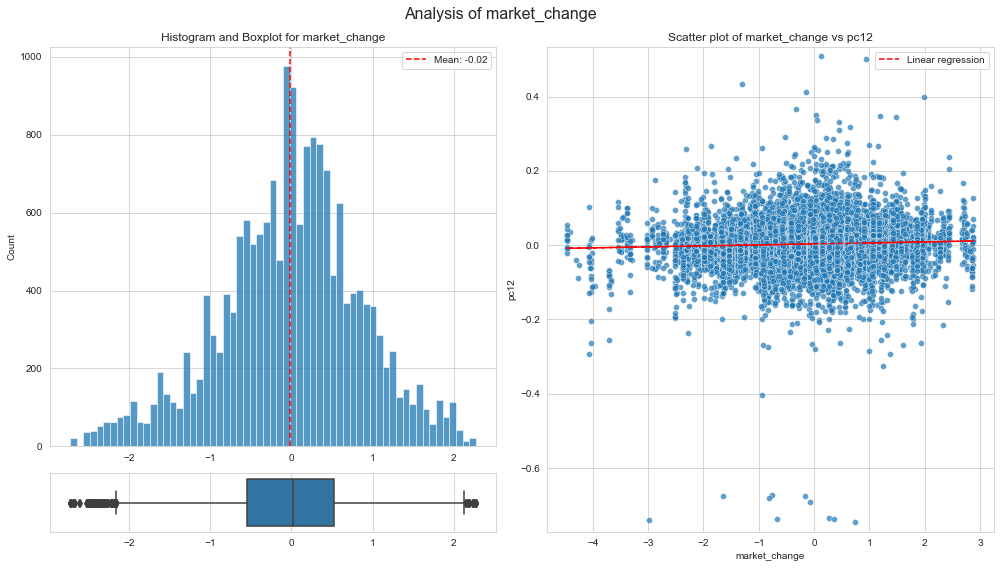

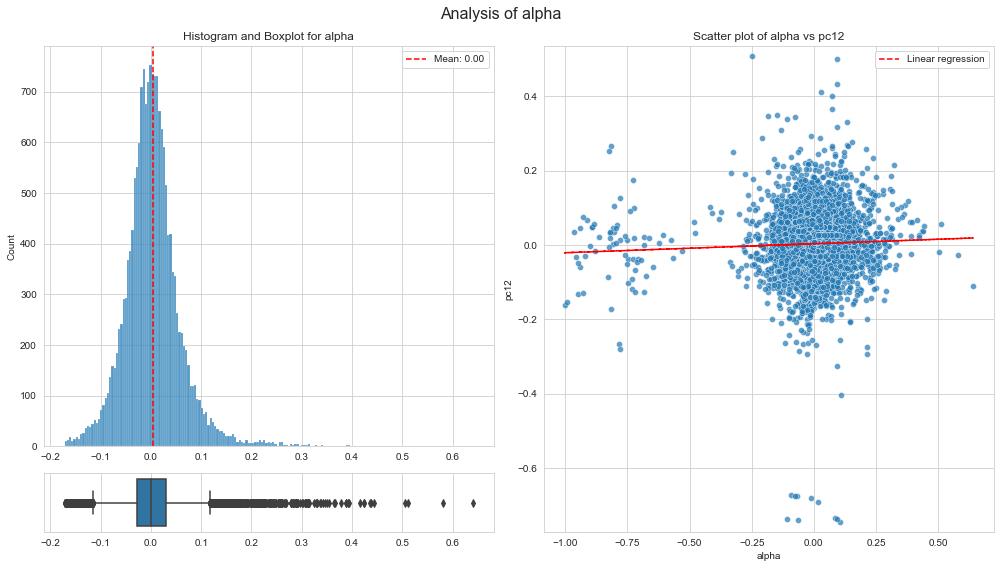

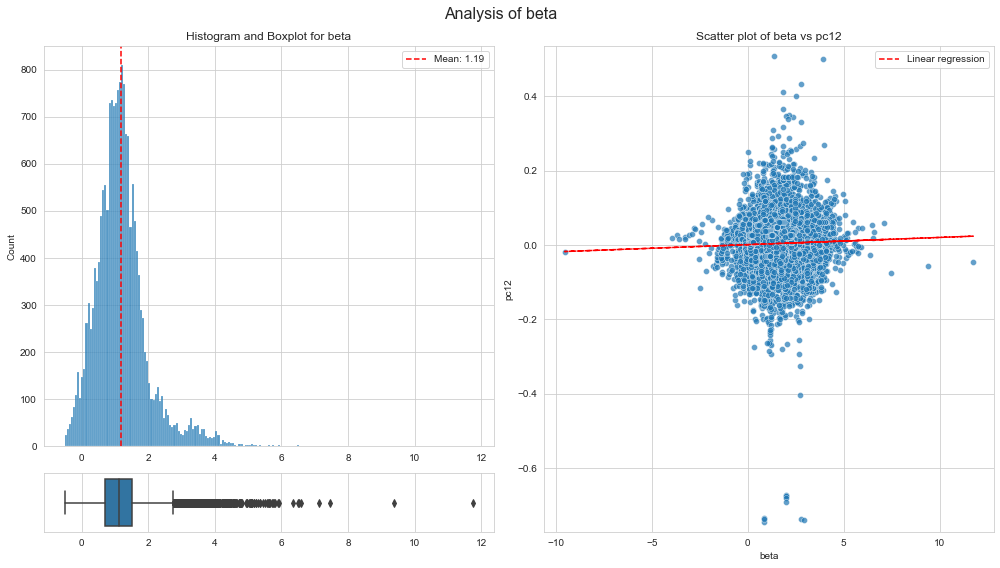

In [63]:
CustomPlotter.combined_plots(
    # df = df.groupby('symbol').get_group('AAPL').reset_index().sort_values(by='pc12', ascending=True)[20:].set_index('t').sort_index(),
    df = df.reset_index().sort_values(by='pc12', ascending=True)[20:].set_index('t').sort_index(),
    columns = df.columns,
    target = 'pc12',
    outlier_drop_pct=1
)

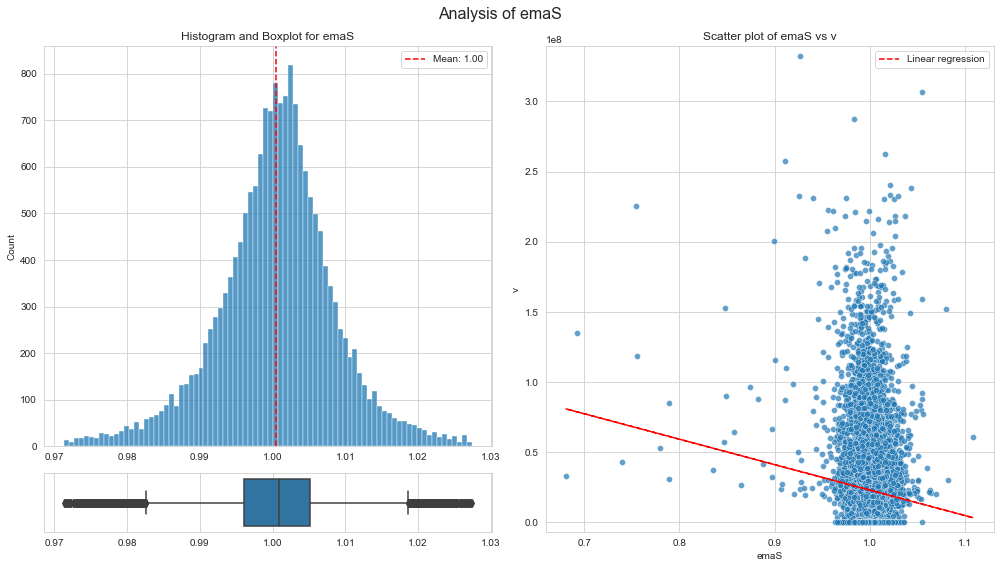

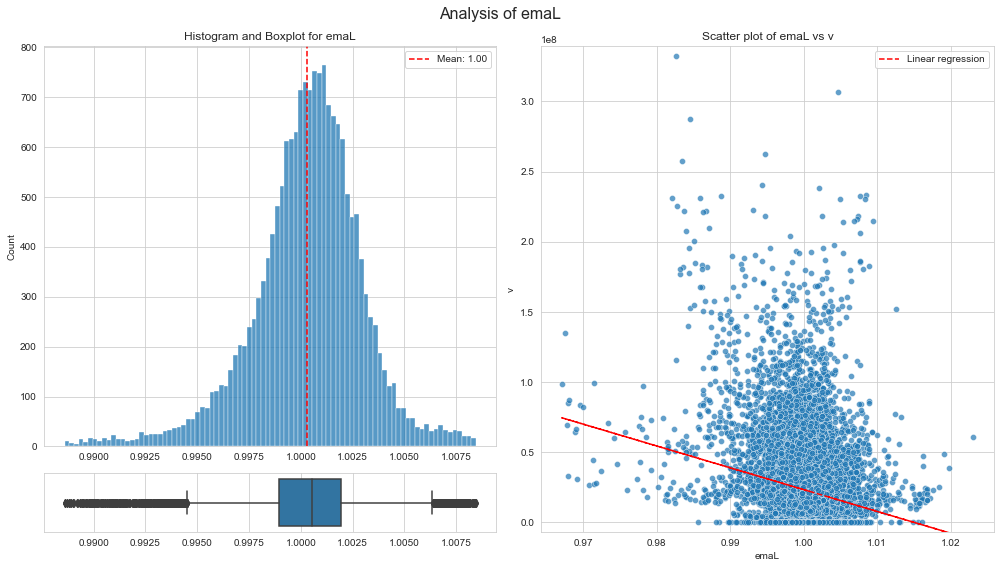

In [64]:
CustomPlotter.combined_plots(
    # df = df.groupby('symbol').get_group('AAPL').reset_index().sort_values(by='pc12', ascending=True)[20:].set_index('t').sort_index(),
    df = df.reset_index().sort_values(by='v', ascending=True)[20:].set_index('t').sort_index(),
    columns = ['emaS', 'emaL'],
    target = 'v',
    outlier_drop_pct=1
)

KeyboardInterrupt: 

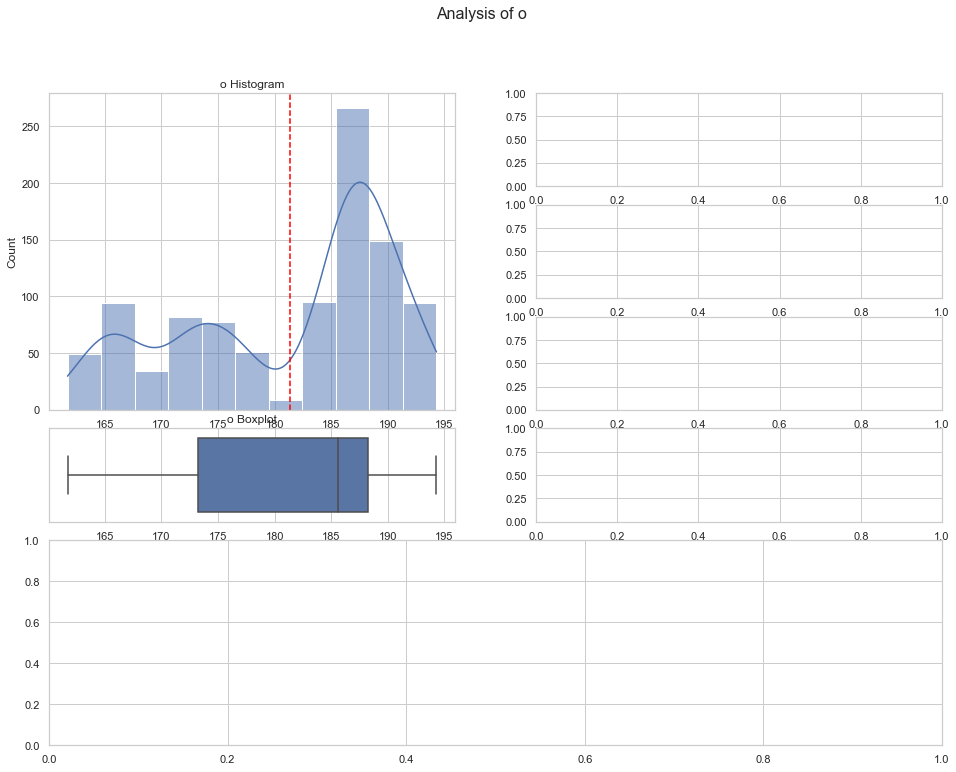

In [197]:
for col in df.columns:
    data = df.groupby('symbol').get_group('AAPL')
    data = data.reset_index()
    data = data.set_index(['t'])

    CustomPlotter.time_series_analysis(data[:1000], col)

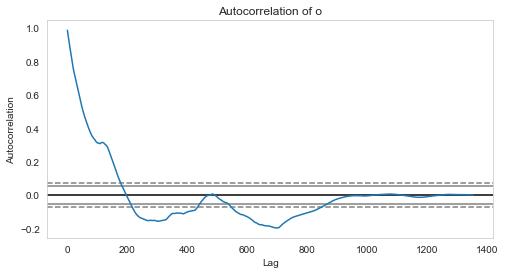

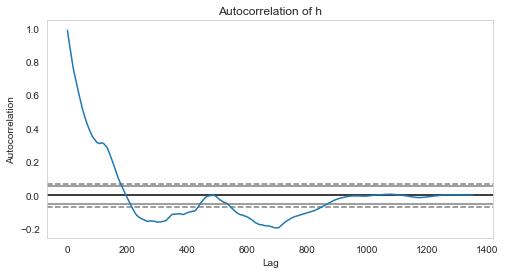

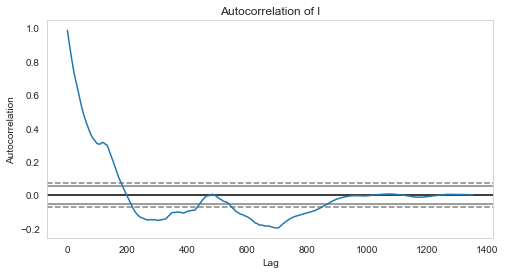

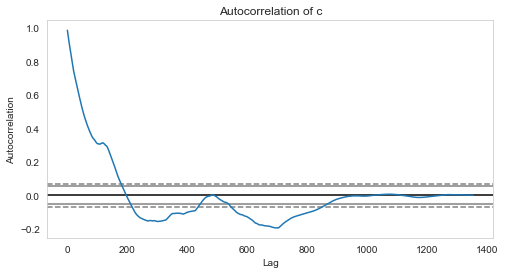

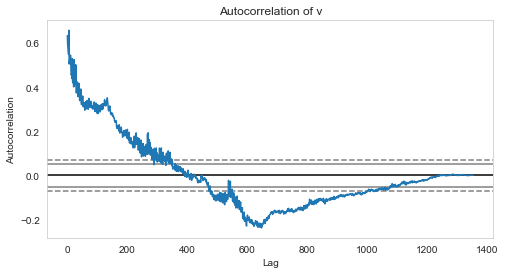

...

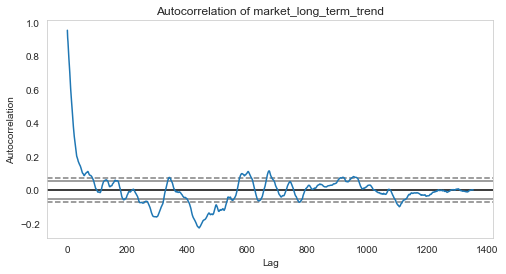

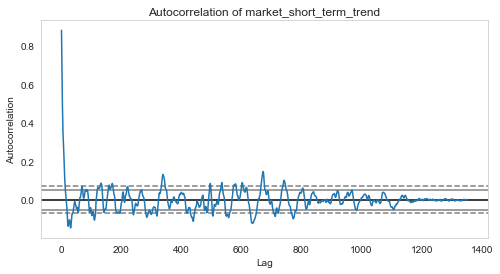

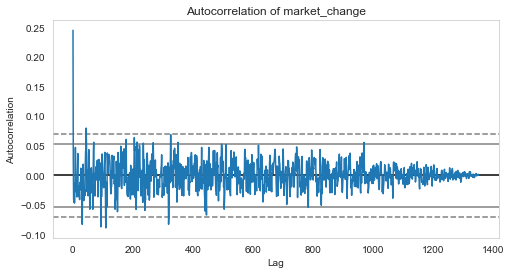

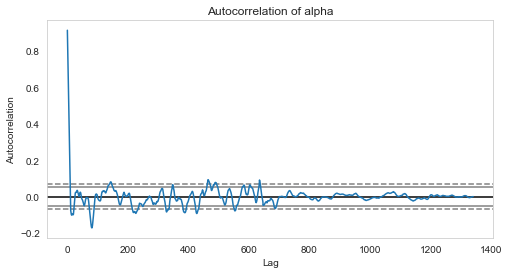

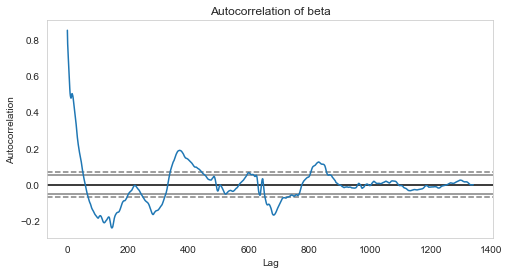

In [65]:
data = df.groupby('symbol').get_group('AAPL').reset_index().set_index(['t']).drop(columns=['symbol'])
CustomPlotter.autocorrelation_analysis(data)

---

In [66]:
data = df.drop(columns=['o', 'h', 'l', 'c', 'v', 'n', 'vw'])

In [67]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [68]:
def print_PCA_analysis(df, target):
    X_numeric = df.select_dtypes(include=[np.number]).drop(columns=target).dropna()
    columns = X_numeric.columns.tolist()

    # Standardize the data
    X_standardized = StandardScaler().fit_transform(X_numeric)

    # Perform PCA
    pca = PCA()
    pca.fit(X_standardized)
    X_pca = pca.transform(X_standardized)

    print("\nExplained variance:")
    for i, var in enumerate(pca.explained_variance_ratio_, 1):
        print("Comp. %d: %.2f%s [%.2f%s]" % (i, var * 100, '%', sum(pca.explained_variance_ratio_[:i]) * 100, '%'))
    #print(pca.explained_variance_ratio_)

    pca_weights = pd.DataFrame(pca.components_, columns=columns, index=[f'Comp. {i+1}' for i in range(pca.n_components_)]).T
    return pca.explained_variance_ratio_, pca_weights

In [69]:
pd.options.display.float_format = "{:,.3f}".format

explained_variance, pca_w = print_PCA_analysis(data, 'pc12')
pca_w


Explained variance:
Comp. 1: 12.84% [12.84%]
Comp. 2: 10.98% [23.81%]
Comp. 3: 9.64% [33.46%]
Comp. 4: 7.45% [40.90%]
Comp. 5: 5.60% [46.51%]
Comp. 6: 4.44% [50.94%]
Comp. 7: 4.15% [55.09%]
Comp. 8: 3.61% [58.71%]
Comp. 9: 3.19% [61.89%]
Comp. 10: 3.00% [64.90%]
Comp. 11: 2.81% [67.70%]
Comp. 12: 2.48% [70.18%]
Comp. 13: 2.35% [72.53%]
Comp. 14: 2.32% [74.85%]
Comp. 15: 2.25% [77.10%]
Comp. 16: 2.23% [79.33%]
Comp. 17: 2.07% [81.39%]
Comp. 18: 1.81% [83.21%]
Comp. 19: 1.73% [84.93%]
Comp. 20: 1.63% [86.56%]
Comp. 21: 1.55% [88.11%]
Comp. 22: 1.50% [89.61%]
Comp. 23: 1.32% [90.93%]
Comp. 24: 1.29% [92.22%]
Comp. 25: 1.21% [93.42%]
Comp. 26: 1.08% [94.50%]
Comp. 27: 0.88% [95.38%]
Comp. 28: 0.68% [96.06%]
Comp. 29: 0.57% [96.63%]
Comp. 30: 0.56% [97.19%]
Comp. 31: 0.53% [97.72%]
Comp. 32: 0.45% [98.17%]
Comp. 33: 0.41% [98.58%]
Comp. 34: 0.35% [98.93%]
Comp. 35: 0.32% [99.25%]
Comp. 36: 0.24% [99.49%]
Comp. 37: 0.20% [99.68%]
Comp. 38: 0.16% [99.84%]
Comp. 39: 0.08% [99.92%]
Comp. 40: 0

,Comp. 1,Comp. 2,Comp. 3,Comp. 4,Comp. 5,Comp. 6,Comp. 7,Comp. 8,Comp. 9,Comp. 10,...,Comp. 34,Comp. 35,Comp. 36,Comp. 37,Comp. 38,Comp. 39,Comp. 40,Comp. 41,Comp. 42,Comp. 43
emaS,-0.330,-0.118,-0.061,0.089,0.069,-0.134,0.048,-0.081,-0.051,-0.048,...,-0.099,0.272,-0.071,0.011,-0.228,0.085,-0.301,-0.021,-0.009,0.000
emaM,-0.375,-0.102,-0.045,0.012,-0.162,0.007,-0.034,-0.120,-0.065,-0.037,...,0.034,0.019,0.104,0.004,0.049,-0.176,0.792,0.048,-0.006,0.000
emaL,-0.334,-0.047,-0.018,-0.066,-0.272,0.060,-0.040,-0.033,-0.014,-0.003,...,-0.015,0.021,0.104,-0.059,0.438,0.078,-0.419,-0.042,0.027,0.000
std,0.127,0.025,-0.270,0.213,0.087,-0.017,-0.091,-0.274,-0.106,-0.024,...,0.374,0.226,0.118,0.235,0.041,-0.020,-0.052,-0.048,-0.008,0.000
pc,-0.183,-0.092,-0.058,0.145,0.364,-0.247,0.144,0.112,0.066,-0.014,...,0.027,-0.360,0.049,-0.012,-0.014,-0.006,0.012,0.001,0.001,0.000
mvS,0.148,-0.321,-0.221,0.095,-0.125,-0.111,-0.045,0.114,-0.013,0.044,...,-0.073,0.003,0.315,-0.017,0.068,-0.053,-0.048,0.457,0.547,-0.000
mvL,0.131,-0.375,-0.172,0.071,-0.051,0.086,-0.057,-0.004,0.021,-0.049,...,0.032,-0.097,-0.438,0.153,-0.083,-0.144,-0.072,0.455,-0.481,0.000
mnS,0.125,-0.163,-0.380,0.077,-0.128,-0.098,-0.010,0.155,-0.075,0.012,...,-0.164,-0.010,0.369,-0.127,0.098,0.078,0.037,-0.400,-0.517,0.000
mnL,0.117,-0.189,-0.385,0.062,-0.009,0.141,-0.021,0.016,-0.060,-0.103,...,-0.069,-0.098,-0.422,0.028,-0.106,0.022,0.058,-0.512,0.446,-0.000
rsi,-0.364,-0.117,-0.053,0.027,0.007,-0.009,-0.010,-0.037,0.038,0.007,...,0.023,0.092,0.211,0.015,-0.650,0.047,-0.075,-0.005,-0.008,0.000


In [70]:
pca_weights_scaled = pca_w * explained_variance
pca_weights_scaled.T.abs().sum().sort_values(ascending=False)

market_short_term_trend   0.126
market_change             0.124
std                       0.124
Current_Ratio             0.123
rsid                      0.122
mvS                       0.121
P/E                       0.120
pc                        0.120
market_correlation        0.119
alpha                     0.119
Gross_Margin              0.117
Operating_Margin          0.117
macds                     0.117
financial_data_age        0.117
time_embed_year_cos       0.117
spy_value                 0.115
P/S                       0.114
obvSH                     0.114
mnS                       0.114
beta                      0.114
P/B                       0.113
Debt_to_Equity            0.113
emaS                      0.113
ROE                       0.111
market_long_term_trend    0.111
mvL                       0.109
time_embed_year_sin       0.109
mnL                       0.108
avgv                      0.105
rlmD                      0.104
Net_Profit_Margin         0.104
emaL    

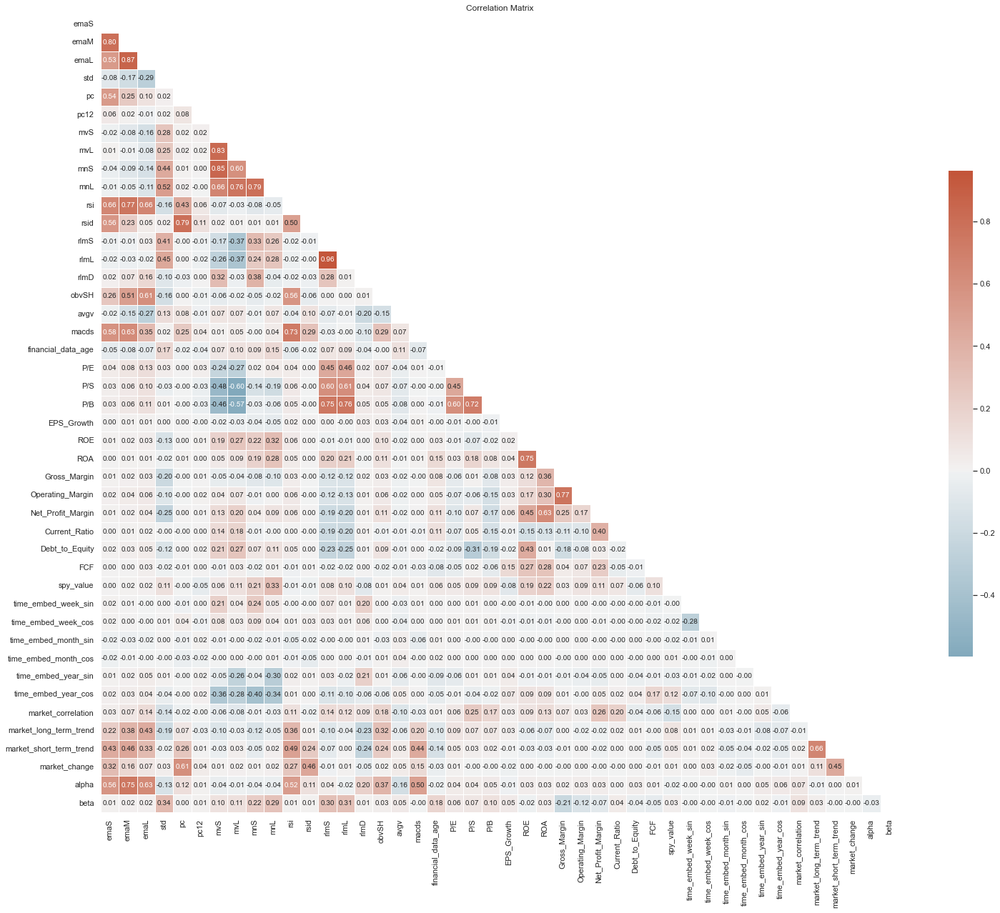

In [71]:
CustomPlotter.plot_corrmatrix(data, figsize=(25, 25))

In [72]:
data.isna().sum()

emaS                          0
emaM                          0
emaL                          0
std                           0
pc                            0
pc12                          0
mvS                           0
mvL                           0
mnS                           0
mnL                           0
rsi                           0
rsid                          0
rlmS                          0
rlmL                          0
rlmD                          0
obvSH                         0
avgv                          0
macds                         0
financial_data_age            0
P/E                           0
P/S                           0
P/B                           0
EPS_Growth                   64
ROE                           0
ROA                           0
Gross_Margin                  0
Operating_Margin              0
Net_Profit_Margin             0
Current_Ratio                 0
Debt_to_Equity              198
FCF                        2568
spy_valu

In [73]:
def compute_ig(df, target):
    X_numeric = df.select_dtypes(include=[np.number]).drop(columns=target)
    y = df[target]

    mi_scores = mutual_info_regression(X_numeric, y)
    mi_scores = pd.Series(mi_scores, name="MI_Scores", index=X_numeric.columns)
    mi_scores = mi_scores.sort_values(ascending=False)

    print("\nInformation Gain:")
    print(mi_scores)

compute_ig(data.dropna(), 'pc12')


Information Gain:
Net_Profit_Margin         0.117
Gross_Margin              0.117
FCF                       0.115
std                       0.115
ROA                       0.111
ROE                       0.105
rlmL                      0.099
Operating_Margin          0.093
Debt_to_Equity            0.087
P/E                       0.082
Current_Ratio             0.080
market_long_term_trend    0.078
P/B                       0.075
P/S                       0.073
beta                      0.066
rlmS                      0.059
EPS_Growth                0.059
spy_value                 0.056
time_embed_year_cos       0.054
mnL                       0.054
time_embed_year_sin       0.051
market_correlation        0.049
emaM                      0.049
financial_data_age        0.047
emaL                      0.045
market_short_term_trend   0.042
mvL                       0.036
mnS                       0.033
market_change             0.030
rsi                       0.024
mvS                  

---

In [74]:
def get_cluster_dataset(fit_data: pd.DataFrame, target_df: pd.DataFrame, include_price=True):
    
    """
    rows_selection = [
        'financial_data_age', 'obvmL', 'obvmS', 'ema12L', 'P/E', 'obv', 'macd_std', 'spy_value',
        'Net_Profit_Margin', 'ROE', 'ROA', 'P/S', 's', 'std', 'Gross_Margin'
    ]
    if include_price: rows_selection.append('price')
    """

    rows_selection = target_df.columns
    fit_cluster_data = fit_data[rows_selection]
    target_cluster_df = target_df[rows_selection]
    
    num_cols = fit_cluster_data.select_dtypes(include=[np.number]).columns
    cluster_scaler = StandardScaler().fit(fit_cluster_data[num_cols])
    fit_cluster_data[num_cols] = pd.DataFrame(cluster_scaler.transform(fit_cluster_data[num_cols]), columns=num_cols, index=fit_cluster_data.index)
    target_cluster_df[num_cols] = pd.DataFrame(cluster_scaler.transform(target_cluster_df[num_cols]), columns=num_cols, index=target_cluster_df.index)

    return target_cluster_df

In [75]:
def cluster_analysis(data, labels):
    df = pd.DataFrame({'id': labels})

    noise_instances = (df['id'] == -1).sum()
    total_instances = len(data)
    noise_proportion = noise_instances / total_instances

    # Calculate cluster size statistics
    if -1 in df['id'].value_counts():
        cluster_sizes = df['id'].value_counts().drop(-1)  # Remove the noise cluster
    else:
        cluster_sizes = df['id'].value_counts()
    
    mean_cluster_size = cluster_sizes.mean()
    sd_cluster_size = cluster_sizes.std()
    min_cluster_size = cluster_sizes.min()
    max_cluster_size = cluster_sizes.max()

    # Print the results
    print(f"   -> Number of clusters: {len(set(labels))}")
    print(f"   -> Number of noise instances: {noise_instances} [{(noise_proportion*100):.2f}%]")
    print(f"   -> Mean cluster size: {mean_cluster_size:.2f}")
    print(f"   -> Standard deviation of cluster size: {sd_cluster_size:.2f}")
    print(f"   -> Minimum cluster size: {min_cluster_size}")
    print(f"   -> Maximum cluster size: {max_cluster_size}")

In [76]:
from itertools import product

def find_best_clustering(X, min_samples_values, xi_values):
    best_score = -1
    best_params = None
    best_model = None

    # Generate all possible combinations of hyperparameters
    param_combinations = list(product(min_samples_values, xi_values))

    for min_samples, xi in param_combinations:
        print("#"*50)
        print(f"Testing ms: {min_samples} - xi: {xi}")

        # Initialize and fit the OPTICS model with the current combination of hyperparameters
        model = OPTICS(min_samples=min_samples, xi=xi)
        model.fit(X)

        labels = model.labels_
        cluster_analysis(X, labels)

        # Get the indices of the samples in X that have a valid cluster label
        valid_sample_indices = np.where(labels != -1)

        # Extract the samples with valid cluster labels and their corresponding labels
        X_valid = X.iloc[valid_sample_indices]
        labels_valid = labels[valid_sample_indices]

        if len(np.unique(labels_valid)) > 1:
            # Calculate the silhouette score for the current model
            score = silhouette_score(X_valid, labels_valid)

            print(f" -> Silhoulette Score: {score:.2f}")

            # Update the best score, best parameters, and best model if the current score is better
            if score > best_score:
                print(" -> New best score!")
                best_score = score
                best_params = {'min_samples': min_samples, 'xi': xi}
                best_model = model

    return best_score, best_params, best_model

In [77]:
cluster_data = get_cluster_dataset(data, data)
cluster_data.head()

,,emaS,emaM,emaL,std,pc,pc12,mvS,mvL,mnS,mnL,...,time_embed_month_sin,time_embed_month_cos,time_embed_year_sin,time_embed_year_cos,market_correlation,market_long_term_trend,market_short_term_trend,market_change,alpha,beta
t,symbol,,,,,,,,,,,,,,,,,,,,,
2018-01-02,BABA,1.011,0.390,0.129,-0.234,2.919,1.019,-1.431,-0.595,-1.983,-1.176,...,-0.002,1.413,-0.014,1.344,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-03,BABA,1.381,0.748,0.365,-0.172,1.771,0.597,-0.771,-0.552,-1.215,-1.122,...,0.292,1.382,0.010,1.344,1.137,4.655,1.655,NaN,NaN,NaN
2018-01-04,BABA,1.180,0.822,0.442,-0.194,0.585,0.304,-0.339,-0.512,-0.708,-1.071,...,0.574,1.291,0.035,1.344,1.050,4.823,1.719,0.757,NaN,NaN
2018-01-05,BABA,1.199,0.974,0.569,-0.199,0.960,0.038,-0.069,-0.475,-0.395,-1.025,...,0.830,1.143,0.059,1.342,1.096,4.331,1.516,-1.126,NaN,NaN
2018-01-06,BABA,1.180,1.095,0.680,-0.210,0.853,-0.204,-1.823,-0.678,-2.255,-1.254,...,1.050,0.946,0.084,1.341,1.109,3.872,1.322,-1.174,NaN,NaN


In [135]:
# Define the range of hyperparameter values to search through
min_samples_values = [5, 25, 50, 100, 200, 500]
xi_values = [0.000001]

# Find the best clustering model
best_score, best_params, best_model = find_best_clustering(
    cluster_data[cluster_data.index.get_level_values('symbol') == 'AAPL'].dropna(),
    [5, 25, 50, 100, 200, 500],
    [0.0000001]
)

print(f"Best Silhouette Score: {best_score}")
print(f"Best Parameters: {best_params}")

##################################################
Testing ms: 5 - xi: 1e-07
   -> Number of clusters: 992
   -> Number of noise instances: 11555 [4.54%]
   -> Mean cluster size: 7.88
   -> Standard deviation of cluster size: 3.43
   -> Minimum cluster size: 5
   -> Maximum cluster size: 27
 -> Silhoulette Score: 0.28
 -> New best score!
##################################################
Testing ms: 25 - xi: 1e-07
   -> Number of clusters: 64
   -> Number of noise instances: 15321 [6.03%]
   -> Mean cluster size: 64.21
   -> Standard deviation of cluster size: 77.02
   -> Minimum cluster size: 26
   -> Maximum cluster size: 583
 -> Silhoulette Score: 0.20
##################################################
Testing ms: 50 - xi: 1e-07
   -> Number of clusters: 25
   -> Number of noise instances: 12401 [4.88%]
   -> Mean cluster size: 290.21
   -> Standard deviation of cluster size: 396.54
   -> Minimum cluster size: 51
   -> Maximum cluster size: 1517
 -> Silhoulette Score: 0.15
#########

In [81]:
best_score, best_params, best_model = find_best_clustering(
    cluster_data.dropna(),
    [10],
    [0.0000001]
)

##################################################
Testing ms: 10 - xi: 1e-07
   -> Number of clusters: 180
   -> Number of noise instances: 11215 [73.96%]
   -> Mean cluster size: 22.06
   -> Standard deviation of cluster size: 13.48
   -> Minimum cluster size: 10
   -> Maximum cluster size: 75
 -> Silhoulette Score: 0.22
 -> New best score!


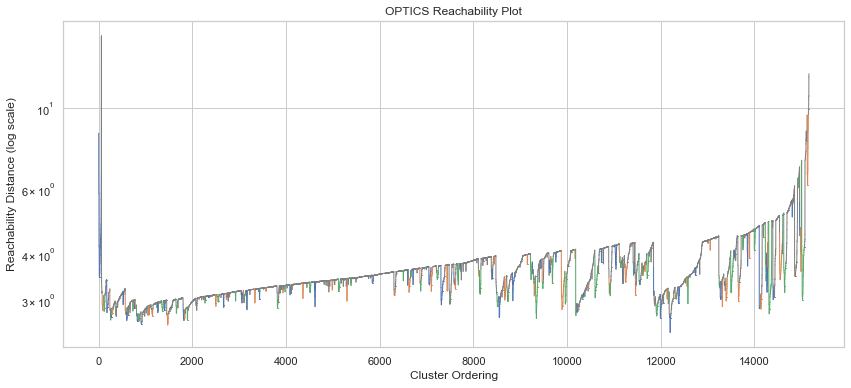

In [82]:
# Extract reachability distances, cluster ordering, and labels
reachability = best_model.reachability_[best_model.ordering_]
cluster_ordering = np.arange(len(reachability))
labels = best_model.labels_[best_model.ordering_]

# Assign colors based on cluster labels
colors = np.where(labels == -1, 'gray', None)
unique_clusters = np.unique(labels[labels != -1])

for i, cluster in enumerate(unique_clusters):
    colors[labels == cluster] = ['C0', 'C1', 'C2'][i % 3]

sn.set_style('whitegrid')

# Create the plot
fig, ax = plt.subplots(figsize=(14, 6))

# Plot each segment of the line with its corresponding color
for i in range(1, len(reachability)):
    ax.plot(cluster_ordering[i-1:i+1], reachability[i-1:i+1], lw=1, color=colors[i-1])

# Set the y-axis to logarithmic scale
ax.set_yscale('log')

plt.title('OPTICS Reachability Plot')
plt.xlabel('Cluster Ordering')
plt.ylabel('Reachability Distance (log scale)')

plt.show()


---

In [84]:
data.columns

Index(['emaS', 'emaM', 'emaL', 'std', 'pc', 'pc12', 'mvS', 'mvL', 'mnS', 'mnL',
       'rsi', 'rsid', 'rlmS', 'rlmL', 'rlmD', 'obvSH', 'avgv', 'macds',
       'financial_data_age', 'P/E', 'P/S', 'P/B', 'EPS_Growth', 'ROE', 'ROA',
       'Gross_Margin', 'Operating_Margin', 'Net_Profit_Margin',
       'Current_Ratio', 'Debt_to_Equity', 'FCF', 'spy_value',
       'time_embed_week_sin', 'time_embed_week_cos', 'time_embed_month_sin',
       'time_embed_month_cos', 'time_embed_year_sin', 'time_embed_year_cos',
       'market_correlation', 'market_long_term_trend',
       'market_short_term_trend', 'market_change', 'alpha', 'beta'],
      dtype='object')

In [85]:
data.index.get_level_values('t').min()
data.index.get_level_values('t').max()

timestamps = data.index.get_level_values('t')
min_timestamp = timestamps.min()
max_timestamp = timestamps.max()

# Find the timestamp that is 80% of the way between the min and max
threshold_timestamp = min_timestamp + 0.8 * (max_timestamp - min_timestamp)
print("80% division timestamp:", threshold_timestamp)


80% division timestamp: 2022-03-13 04:48:00


In [86]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import catboost as cat

# Split the data
X = data.drop('pc12', axis=1)
y = data['pc12']
X_train = X[X.index.get_level_values('t') <= threshold_timestamp]
X_test = X[X.index.get_level_values('t') > threshold_timestamp]
y_train = y[X.index.get_level_values('t') <= threshold_timestamp]
y_test = y[X.index.get_level_values('t') > threshold_timestamp]

# Apply Standard Scaler
labels_scaler = StandardScaler()
X_train_scaled = labels_scaler.fit_transform(X_train)
X_test_scaled = labels_scaler.transform(X_test)

targets_scaler = StandardScaler()
y_train_scaled = targets_scaler.fit_transform(y_train.to_numpy().reshape(-1, 1))
y_test_scaled = targets_scaler.transform(y_test.to_numpy().reshape(-1, 1))

print(X_train_scaled.shape)
print(X_test_scaled.shape)
print(y_train_scaled.shape)
print(y_test_scaled.shape)

(14168, 43)
(3956, 43)
(14168, 1)
(3956, 1)


In [3]:
cat.cv(
    cat.Pool(X_train_scaled, y_train_scaled),
    {
        'learning_rate': 0.5,
        'iterations': 40000,
        'loss_function': 'RMSE',
        'early_stopping_rounds': 100,
    },
    fold_count=5,
    plot=True,
    verbose=2000
)

NameError: name 'cat' is not defined

[0]	validation_0-rmse:1.59948
[103]	validation_0-rmse:1.75915


<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

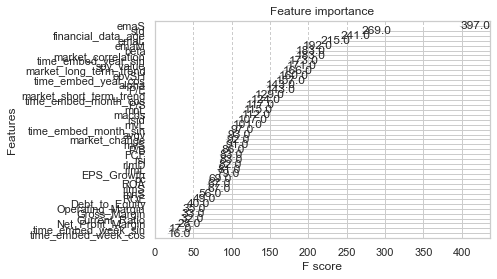

In [87]:
# Initialize the model
model = xgb.XGBRegressor(
    **{
        'learning_rate': 0.1,
        'max_depth': 6,
        'n_estimators': 1500,
        'early_stopping_rounds': 100
    }
)

# Train the model
model.fit(
    pd.DataFrame(X_train_scaled, columns=X.columns),
    y_train_scaled,
    eval_set=[(pd.DataFrame(X_test_scaled, columns=X.columns), y_test_scaled)], 
    verbose=1000
)

# Visualize feature importance
xgb.plot_importance(model)

In [88]:
# Train CatBoost Regressor with fancy visuals
model = cat.CatBoostRegressor(
    iterations=4000,
    learning_rate=0.1,
    # early_stopping_rounds=1000,
    loss_function='RMSE',
    verbose=1000
)

model.fit(
    cat.Pool(X_train_scaled, y_train_scaled),
    eval_set=cat.Pool(X_test_scaled, y_test_scaled),
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.9915257	test: 1.5027344	best: 1.5027344 (0)	total: 71.7ms	remaining: 4m 46s
1000:	learn: 0.2714132	test: 1.6668811	best: 1.5027344 (0)	total: 3.51s	remaining: 10.5s
2000:	learn: 0.1537114	test: 1.6854281	best: 1.5027344 (0)	total: 6.71s	remaining: 6.71s
3000:	learn: 0.1020646	test: 1.6886329	best: 1.5027344 (0)	total: 9.99s	remaining: 3.32s
3999:	learn: 0.0703909	test: 1.6910543	best: 1.5027344 (0)	total: 13.4s	remaining: 0us

bestTest = 1.502734372
bestIteration = 0

Shrink model to first 1 iterations.


In [46]:
pd.DataFrame(X_train_scaled).isna().T.any()

32366

In [50]:
model = RandomForestRegressor(
    n_estimators=200,
    max_depth=5,
    min_samples_split=2,
    verbose=True,
    n_jobs=-1
)

model.fit(
    X_train_scaled[~pd.DataFrame(X_train_scaled).isna().T.any()],
    y_train_scaled[~pd.DataFrame(X_train_scaled).isna().T.any()]
)

/var/folders/4z/l7kc3ncn7g3628qd59lkh1km0000gn/T/ipykernel_20708/4059317210.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   20.9s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  1.8min finished


RandomForestRegressor(max_depth=5, n_estimators=200, n_jobs=-1, verbose=True)

In [53]:
# Evaluate using MSE
# y_pred_train = model.predict(X_train_scaled)
# y_pred_test = model.predict(X_test_scaled)
y_pred_train = model.predict(X_train_scaled[~pd.DataFrame(X_train_scaled).isna().T.any()])
y_pred_test = model.predict(X_test_scaled[~pd.DataFrame(X_test_scaled).isna().T.any()])
y_targ_train = y_train_scaled[~pd.DataFrame(X_train_scaled).isna().T.any()]
y_targ_test = y_test_scaled[~pd.DataFrame(X_test_scaled).isna().T.any()]

mse_train = mean_squared_error(y_targ_train, y_pred_train)
mse_test = mean_squared_error(y_targ_test, y_pred_test)
print(f'Train MSE: {mse_train:.2f}')
print(f'Test MSE: {mse_test:.2f}')

# Predict the test dataset
test_predictions = targets_scaler.inverse_transform(y_pred_test.reshape(-1, 1))
test_targets = y_targ_test

train_predictions = targets_scaler.inverse_transform(y_pred_train.reshape(-1, 1))
train_targets = y_targ_train

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 200 out of 200 | elapsed:    0.2s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


Train MSE: 0.85
Test MSE: 19.97


[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 200 out of 200 | elapsed:    0.1s finished


In [51]:
# Evaluate using MSE
y_pred_train = model.predict(X_train_scaled)
y_pred_test = model.predict(X_test_scaled)

mse_train = mean_squared_error(y_train_scaled, y_pred_train)
mse_test = mean_squared_error(y_test_scaled, y_pred_test)
print(f'Train MSE: {mse_train:.2f}')
print(f'Test MSE: {mse_test:.2f}')

# Predict the test dataset
test_predictions = targets_scaler.inverse_transform(model.predict(X_test_scaled).reshape(-1, 1))
test_targets = y_test.to_numpy()

train_predictions = targets_scaler.inverse_transform(model.predict(X_train_scaled).reshape(-1, 1))
train_targets = y_train.to_numpy()

ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

In [37]:
pd.options.display.float_format = "{:,.3f}".format

def plot_predictions(train_predictions, train_targets, test_predictions, test_targets):
    plt.figure(figsize=(12, 6))
    sn.set_style("whitegrid")

    plt.scatter(train_targets.flatten(), train_predictions.flatten(), alpha=0.5, label="Train")
    plt.scatter(test_targets.flatten(), test_predictions.flatten(), alpha=0.5, label="Test")

    targets = np.concatenate((train_targets, test_targets)).flatten()
    predictions = np.concatenate((train_predictions, test_predictions)).flatten()

    lin_reg = LinearRegression()
    lin_reg.fit(targets.reshape(-1, 1), predictions.reshape(-1, 1))
    y_pred_reg = lin_reg.predict(targets.reshape(-1, 1))

    plt.plot(targets, y_pred_reg, color='red', linestyle='--', label='Linear regression')

    plt.xlabel('Expected Value')
    plt.ylabel('Predicted Value')
    plt.title('Scatter Plot of Expected Value vs Predicted Value')
    
    # plt.xlim((-50, 50))
    # plt.ylim((0, 5))
    
    plt.legend()
    plt.show()

def print_metrics(train_predictions, train_targets, test_predictions, test_targets):
    results = {}

    for name, pred, targ in zip(
        ["Train", "Test"],
        [train_predictions, test_predictions],
        [train_targets, test_targets],
    ):
        results[name] = {
            "r2": r2_score(targ.flatten(), pred.flatten()),
            "rmse": np.sqrt(mean_squared_error(targ.flatten(), pred.flatten())),
            "mae": mean_absolute_error(targ.flatten(), pred.flatten()),
            "mse": mean_squared_error(targ.flatten(), pred.flatten()),
        }

    return pd.DataFrame(results)

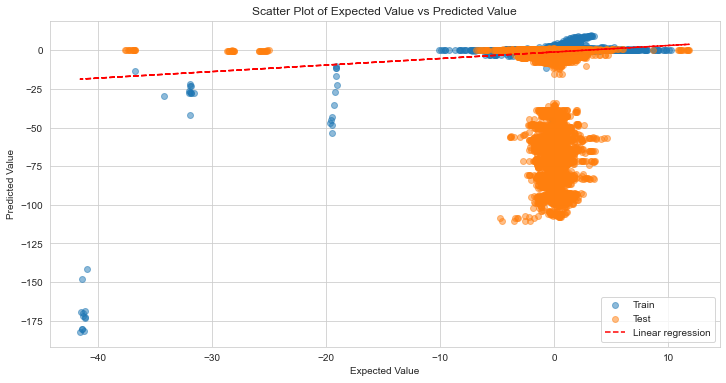

,Train,Test
r2,-1.040,-255.885
rmse,1.449,19.135
mae,0.673,5.708
mse,2.099,366.159


In [54]:
plot_predictions(
    train_predictions, train_targets,
    test_predictions, test_targets,
)
print_metrics(
    train_predictions, train_targets,
    test_predictions, test_targets,
)

In [161]:
pd.qcut(test_targets, 15, labels=False)

array([ 0,  0,  1, ..., 12, 14,  7])

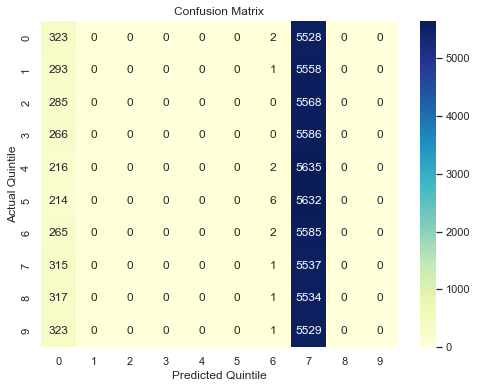

In [163]:
from sklearn.metrics import confusion_matrix

N = 10
target_quintiles = pd.qcut(test_targets, N, labels=False)

# Divide prediction values into the same N quintiles based on target value ranges
prediction_quintiles = np.zeros(test_predictions.shape, dtype=int)
for i in range(N):
    if i == 0:
        upper_bound = test_targets[target_quintiles == i].max()
        mask = test_predictions < upper_bound
    elif i == (N-1):
        upper_bound = test_targets[target_quintiles == i].max()
        lower_bound = test_targets[target_quintiles == i].min()
        mask = (test_predictions >= lower_bound) & (test_predictions < upper_bound)
    else:
        upper_bound = test_targets[target_quintiles == i].max()
        lower_bound = test_targets[target_quintiles == i].min()
        mask = test_predictions >= lower_bound

    prediction_quintiles[mask] = i

# Calculate confusion matrix
cm = confusion_matrix(target_quintiles, prediction_quintiles)

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(8, 6))
sn.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
ax.set_xlabel("Predicted Quintile")
ax.set_ylabel("Actual Quintile")
ax.set_title("Confusion Matrix")
plt.show()

---

In [280]:
def fit_targets_classes(targets):
    return pd.qcut(targets, 5, labels=False)

def predict_targets_classes(fitted_categories: pd.DataFrame, fitted_targets, predict_targets):
    fitted_classes = fitted_categories
    predict_quintiles = np.zeros(predict_targets.shape, dtype=int)

    for i in range(N):
        if i == 0:
            upper_bound = fitted_targets[fitted_classes == i].max()
            mask = predict_targets < upper_bound
        elif i == (N-1):
            upper_bound = fitted_targets[fitted_classes == i].max()
            lower_bound = fitted_targets[fitted_classes == i].min()
            mask = (predict_targets >= lower_bound) & (predict_targets < upper_bound)
        else:
            upper_bound = fitted_targets[fitted_classes == i].max()
            lower_bound = fitted_targets[fitted_classes == i].min()
            mask = predict_targets >= lower_bound

        predict_quintiles[mask] = i

    return (pd.DataFrame(predict_quintiles).astype('category'))

In [281]:
train_classification = fit_targets_classes(y_train)
test_classification = predict_targets_classes(train_classification, pd.DataFrame(y_train), pd.DataFrame(y_test))

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

train_encoded = le.fit_transform(train_classification)
test_encoded = le.transform(test_classification)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


In [283]:
len(np.unique(train_encoded))

5

In [211]:
data.columns

Index(['diff', 'emaS', 'emaM', 'emaL', 'std', 'pc', 'pc12', 'mvS', 'mvL',
       'mnS', 'mnL', 'rsi', 'rsid', 'rlmS', 'rlmL', 'rlmD', 'obv', 'obvmS',
       'obvmL', 'obvsL', 'obvSH', 'lavgv', 'lavm', 'lavs', 'avgv', 'ewm_12',
       'ewm_26', 'macd', 'signal', 'macd_std', 'macds', 'financial_data_age',
       'P/E', 'P/S', 'P/B', 'EPS_Growth', 'ROE', 'ROA', 'Gross_Margin',
       'Operating_Margin', 'Net_Profit_Margin', 'Current_Ratio',
       'Debt_to_Equity', 'FCF', 'spy_value', 'time_embed_day_sin',
       'time_embed_day_cos', 'time_embed_week_sin', 'time_embed_week_cos',
       'time_embed_month_sin', 'time_embed_month_cos', 'time_embed_year_sin',
       'time_embed_year_cos', 'market_correlation', 'market_long_term_trend',
       'market_short_term_trend', 'market_change', 'alpha', 'beta'],
      dtype='object')

In [1]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [240]:
model = Sequential([
    Dense(2048, activation='relu', input_shape=(X_train.shape[1],)),
    # Dropout(0.4),
    Dense(2048, activation='relu'),
    # Dropout(0.3),
    Dense(2048, activation='relu'),
    # Dropout(0.3),
    Dense(64, activation='relu'),
    # Dropout(0.2),
    Dense(5, activation='softmax')
])
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_27 (Dense)             (None, 2048)              120832    
_________________________________________________________________
dense_28 (Dense)             (None, 2048)              4196352   
_________________________________________________________________
dense_29 (Dense)             (None, 2048)              4196352   
_________________________________________________________________
dense_30 (Dense)             (None, 64)                131136    
_________________________________________________________________
dense_31 (Dense)             (None, 5)                 325       
Total params: 8,644,997
Trainable params: 8,644,997
Non-trainable params: 0
_________________________________________________________________


In [241]:
history = model.fit(
    X_train_scaled,
    train_classification,
    epochs=100,
    batch_size=256,
    validation_split=0.2,
    callbacks=[
        EarlyStopping(patience=10, restore_best_weights=True)
    ]
)

Epoch 1/100
  1/612 [..............................] - ETA: 3:09 - loss: 1.6152 - accuracy: 0.1914

2023-04-22 18:53:49.707742: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


612/612 [==============================] - ETA: 0s - loss: 1.6094 - accuracy: 0.2005

2023-04-22 18:54:03.239702: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


612/612 [==============================] - 15s 25ms/step - loss: 1.6094 - accuracy: 0.2005 - val_loss: 1.6098 - val_accuracy: 0.1926
Epoch 2/100
612/612 [==============================] - 15s 24ms/step - loss: 1.6094 - accuracy: 0.2002 - val_loss: 1.6096 - val_accuracy: 0.1926
Epoch 3/100
612/612 [==============================] - 15s 25ms/step - loss: 1.6094 - accuracy: 0.2017 - val_loss: 1.6099 - val_accuracy: 0.1926
Epoch 4/100
612/612 [==============================] - 16s 26ms/step - loss: 1.6094 - accuracy: 0.2017 - val_loss: 1.6097 - val_accuracy: 0.1938
Epoch 5/100
612/612 [==============================] - 16s 26ms/step - loss: 1.6094 - accuracy: 0.2011 - val_loss: 1.6097 - val_accuracy: 0.1938
Epoch 6/100
612/612 [==============================] - 16s 26ms/step - loss: 1.6094 - accuracy: 0.2016 - val_loss: 1.6098 - val_accuracy: 0.1938
Epoch 7/100
612/612 [==============================] - 16s 26ms/step - loss: 1.6094 - accuracy: 0.2002 - val_loss: 1.6098 - val_accuracy: 0.19

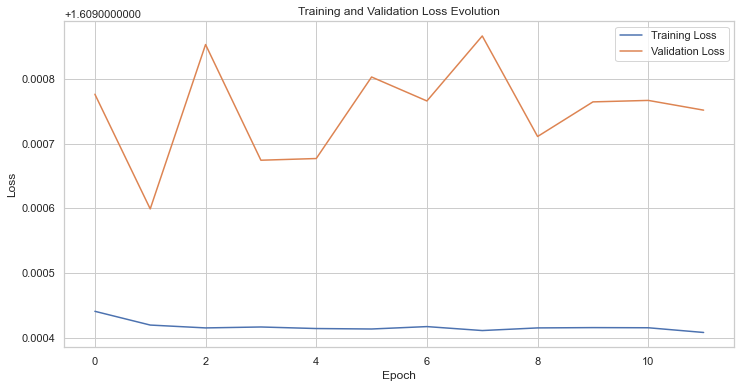

In [242]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the training and validation loss
plt.figure(figsize=(12, 6))
sn.lineplot(x=range(len(train_loss)), y=train_loss, label='Training Loss')
sn.lineplot(x=range(len(val_loss)), y=val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Evolution')
plt.legend()
plt.show()

In [ ]:
eval_results = model.evaluate(X_test, y_test, verbose=1)
print(f"Test loss: {eval_results[0]}, Test MSE: {eval_results[1]}")

# Make predictions
predictions = model.predict(X_test)

In [291]:
columns = [
    'pc', 'emaL', 'emaS', 'mvS', 'rsi', 'macds', 'lavs', 'Net_Profit_Margin', 'market_correlation',
    'Gross_Margin', 'P/E', 'time_embed_year_sin', 'time_embed_year_cos', 'financial_data_age', 'obvmL'
]
len(columns)

15

In [293]:
model = cat.CatBoostClassifier(
    iterations=40000,
    learning_rate=0.1,
    # early_stopping_rounds=1000,
    loss_function='MultiClass',
    classes_count=5,
    verbose=1000
)

model.fit(
    cat.Pool(pd.DataFrame(X_train_scaled, columns=X.columns)[columns], train_encoded),
    eval_set=cat.Pool(pd.DataFrame(X_test_scaled, columns=X.columns)[columns], test_encoded),
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.6073223	test: 1.6094744	best: 1.6094744 (0)	total: 63.2ms	remaining: 42m 8s
1000:	learn: 1.3187665	test: 1.7154639	best: 1.6071083 (17)	total: 36s	remaining: 23m 21s


KeyboardInterrupt: 

---

In [128]:
import shap
shap.initjs()

In [129]:
cat_data = pd.DataFrame(X_train_scaled, columns=data.drop(columns=['pc12']).columns)
explainer_cat = shap.TreeExplainer(model)
explainer_cat

In [130]:
shap_values_cat = explainer_cat.shap_values(cat_data)

In [131]:
shap.force_plot(explainer_cat.expected_value, shap_values_cat[0,:], cat_data.iloc[0,:])

In [132]:
shap.force_plot(explainer_cat.expected_value, shap_values_cat[0:1000], cat_data[0:1000])